# <center>**Compare Final Model Performances**</center>  

---
**Purpose:** This notebook serves as the culmination of the project, focusing on a comprehensive comparative analysis of the final trained XGBoost, Multi-Layer Perceptron (MLP), and Graph Neural Network (GNN) models. It involves loading the best-performing models and data splits, generating predictions, evaluating their performance using key metrics, and visualizing their predictive capabilities to draw conclusions on their suitability for `pGI50` prediction.

---

## 1. Setup Notebook
This section initializes the notebook environment by importing all necessary libraries, configuring system settings for performance and reproducibility, and establishing global parameters and file paths.

### 1.1. Configure Environment
This sub-section configures environment variables for CPU usage optimization and sets up PyTorch-specific thread management. It also ensures the project's root directory is added to the system path for proper custom module imports and includes a utility to capture the Git commit ID for reproducibility.

In [1]:
import os
import sys
import time

# General CPU Usage Optimization
os.environ["OMP_NUM_THREADS"] = "16"
os.environ["MKL_NUM_THREADS"] = "16"
os.environ["OPENBLAS_NUM_THREADS"] = "16"
os.environ["NUMEXPR_NUM_THREADS"] = "16"

# PyTorch-specific CPU Usage Optimization (if not using GPU exclusively)
import torch

try:
    torch.set_num_threads(16)
except RuntimeError as e:
    print(f"Warning: Could not set torch.set_num_threads.\n{e}")

try:
    torch.set_num_interop_threads(16)
except RuntimeError as e:
    print(f"Warning: Could not set torch.set_num_interop_threads.\n{e}")

print(f"PyTorch threads: {torch.get_num_threads()}")
print(f"PyTorch interop threads: {torch.get_num_interop_threads()}")

# Configure Project Path
from pathlib import Path

# Get the current working directory
current_dir = os.getcwd()

# Navigate up to the project root directory
project_root = Path(current_dir).parent.resolve()

# Add the project root to sys.path if it's not already there
if str(project_root) not in sys.path:
    sys.path.append(str(project_root))

print(f"Project root added to sys.path: {project_root}")

# Utility for Git commit ID for reproducibility
import subprocess


def get_git_commit_hash():
    try:
        # Get the short commit hash
        commit_hash = (
            subprocess.check_output(["git", "rev-parse", "--short", "HEAD"])
            .strip()
            .decode("ascii")
        )
        return commit_hash
    except (subprocess.CalledProcessError, FileNotFoundError):
        return "unknown_commit"


current_commit_hash = get_git_commit_hash()
print(f"Current Git Commit ID: {current_commit_hash}")

# Suppress Warnings for Cleaner Output
import warnings

warnings.filterwarnings("ignore")

PyTorch threads: 16
PyTorch interop threads: 16
Project root added to sys.path: C:\Users\Acer\Desktop\Projects for Data Science\Drug Gi50 Value Prediction
Current Git Commit ID: 0711af9


### 1.2. Import Libraries
All required Python libraries for data manipulation, molecular handling, PyTorch core functionalities, PyTorch Geometric, machine learning utilities, model loading, and plotting are imported here.

In [2]:
# Standard Library Imports
import sqlite3
import math
import textwrap
import re  # For regex
import cairosvg  # To convert SVG to high-resolution PNG
from io import BytesIO  # To handle image data in memory
from PIL import Image
from datetime import datetime


# Core Data Science Libraries
import numpy as np
import pandas as pd


# Molecular Handling (RDKit) Libraries
from rdkit import Chem
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D


# PyTorch Core Libraries
import torch.nn as nn  # Neural network modules like Linear, ReLU
import torch.nn.functional as F  # Functional interface for activations, e.g. F.relu
from torch.utils.data import (
    TensorDataset,
    DataLoader,
)  # For MLP


# PyTorch Geometric (PyG) Libraries
from torch_geometric.data import Data # The graph data object in PyG
from torch_geometric.loader import DataLoader as PyGDataLoader # PyG DataLoader for graphs
import torch_geometric.nn as pyg_nn # Common GNN layers (e.g., GCNConv, GraphSAGEConv)
import torch_geometric.utils as pyg_utils # Utility functions for graph manipulation


# Machine Learning Utilities
from sklearn.metrics import mean_squared_error, r2_score  # For model evaluation metrics
from sklearn.preprocessing import StandardScaler # For feature scaling


# Model Loading & Hyperparameter Optimization Libraries
import joblib # For loading XGBoost models
import optuna # For loading Optuna study results (best params)


# Plotting Libraries
import matplotlib.pyplot as plt
plt.rcParams['text.usetex'] = True
import seaborn as sns


# Visualizing Molecules
from IPython.display import display, Markdown


# Conditional import for progress bars (tqdm)
tqdm_notebook_available = False # Initialize flag
try:
    from tqdm.notebook import tqdm
    tqdm.pandas() # Enable tqdm for pandas apply
    tqdm_notebook_available = True
    print("tqdm.notebook found and enabled for pandas.")

except ImportError:
    print("tqdm.notebook not found. Install with 'pip install tqdm'.")


# Custom MLP and GNN Model Classes
try:
    from src.models.mlp_models import MLP
    print("MLP model class imported successfully from src.models.mlp_models.")

except ImportError as e:
    print(f"ERROR: Could not import MLP class. Please check path and file: {e}")
    print("Ensure 'src/models/mlp_models.py' exists relative to your project root and contains the 'MLP' class.")


try:
    from src.models.gnn_models import GNN
    print("GNN model class imported successfully from src.models.gnn_models.")

except ImportError as e:
    print(f"ERROR: Could not import GNN class. Please check path and file: {e}")
    print("Ensure 'src/models/gnn_models.py' exists relative to your project root and contains the 'GNN' class.")

tqdm.notebook found and enabled for pandas.
MLP model class imported successfully from src.models.mlp_models.
GNN model class imported successfully from src.models.gnn_models.


### 1.3. Define Device (For PyTorch/PyG Models)
This sub-section explicitly defines the computing device (GPU if available, otherwise CPU) that will be used for model inference.

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


### 1.4. Define Essential Directory and File Paths
This sub-section predefines all necessary directory and file paths for loading data splits, pre-saved graph objects, trained models, etc.

In [6]:
# Define paths for data splits, PyG Data graph objects, final models, and Optuna studies
data_splits_dir = Path("../data/splits") # Universal data splits
pyg_data_graphs_dir = Path("../data/pyg_data_graphs") # Directory for saved PyG Data objects

xgboost_models_dir = Path("../models/xgb")
mlp_models_dir = Path("../models/mlp")
gnn_models_dir = Path("../models/gnn")

# Optuna database paths
optuna_studies_dir = Path("../studies")

# ChEMBL SQLite database path
chembl_db_file_path = Path("../data/raw/chembl_35_sqlite/chembl_35/chembl_35_sqlite/chembl_35.db")

print("\n--- Verifying Path Existence ---")

paths_to_check = {
    "Data Splits Directory": data_splits_dir,
    "PyG Data Graphs Directory": pyg_data_graphs_dir,
    "XGBoost Models Directory": xgboost_models_dir,
    "MLP Models Directory": mlp_models_dir,
    "GNN Models Directory": gnn_models_dir,
    "Optuna Studies Database Directory": optuna_studies_dir,
    "ChEMBL SQLite Database": chembl_db_file_path,
}

for name, path in paths_to_check.items():
    if path.is_dir():
        print(f"{name}: '{path.resolve()}' exists.")
    else:
        print(f"{name}: '{path.resolve()}' does NOT exist. Please ensure it exists or is created and populated before running this notebook.")

print("--- Path Verification Complete ---")

# Define full paths to your Optuna databases for loading
xgboost_optuna_db_path = f"sqlite:///{optuna_studies_dir / 'xgboost_study/xgb_optuna_study_refined.db'}"
mlp_optuna_db_path = f"sqlite:///{optuna_studies_dir / 'mlp_study/mlp_optuna_study_refined.db'}"
gnn_optuna_db_path = f"sqlite:///{optuna_studies_dir / 'gnn_study/gnn_optuna_study_refined.db'}"

print("\nAll paths configured and necessary directories ensured.")


--- Verifying Path Existence ---
Data Splits Directory: 'C:\Users\Acer\Desktop\Projects for Data Science\Drug Gi50 Value Prediction\data\splits' exists.
PyG Data Graphs Directory: 'C:\Users\Acer\Desktop\Projects for Data Science\Drug Gi50 Value Prediction\data\pyg_data_graphs' exists.
XGBoost Models Directory: 'C:\Users\Acer\Desktop\Projects for Data Science\Drug Gi50 Value Prediction\models\xgb' exists.
MLP Models Directory: 'C:\Users\Acer\Desktop\Projects for Data Science\Drug Gi50 Value Prediction\models\mlp' exists.
GNN Models Directory: 'C:\Users\Acer\Desktop\Projects for Data Science\Drug Gi50 Value Prediction\models\gnn' exists.
Optuna Studies Database Directory: 'C:\Users\Acer\Desktop\Projects for Data Science\Drug Gi50 Value Prediction\studies' exists.
ChEMBL SQLite Database: 'C:\Users\Acer\Desktop\Projects for Data Science\Drug Gi50 Value Prediction\data\raw\chembl_35_sqlite\chembl_35\chembl_35_sqlite\chembl_35.db' does NOT exist. Please ensure it exists or is created and po

## 2. Load Best Hyperparameters for Each Model
This section loads the optimized hyperparameters for XGBoost, MLP, and GNN models from their respective Optuna study databases. These parameters are crucial for re-initializing the best-performing models.

### 2.1. For XGBoost

In [7]:
print("\n--- Loading Best Hyperparameters from XGBoost Optuna Study ---")
xgboost_best_params = {}
try:
    xgboost_study = optuna.load_study(
        study_name="xgboost_regression_pGI50_refined",
        storage=xgboost_optuna_db_path
    )
    xgboost_best_params = xgboost_study.best_trial.params
    print(f"\nXGBoost best hyperparameters: {xgboost_best_params}")
except Exception as e:
    print(f"\nERROR: Could not load XGBoost Optuna study.")


--- Loading Best Hyperparameters from XGBoost Optuna Study ---

XGBoost best hyperparameters: {'learning_rate': 0.035852762830664464, 'max_depth': 5, 'subsample': 0.9495734596109369, 'colsample_bytree': 0.8341043325804682, 'reg_alpha': 0.001044582788012534, 'reg_lambda': 0.005906794482974822, 'gamma': 0.029957788076497214, 'min_child_weight': 9}


### 2.2. For MLP

In [8]:
print("\n--- Loading Best Hyperparameters from MLP Optuna Study ---")
mlp_best_params = {}
try:
    mlp_study = optuna.load_study(
        study_name="mlp_regression_pGI50_refined",
        storage=mlp_optuna_db_path
    )
    mlp_best_params = mlp_study.best_trial.params
    print(f"\nMLP best hyperparameters: {mlp_best_params}")
except Exception as e:
    print(f"\nERROR: Could not load MLP Optuna study.")


--- Loading Best Hyperparameters from MLP Optuna Study ---

MLP best hyperparameters: {'hidden_size': 802, 'num_layers': 5, 'lr': 0.0011269551001517972, 'batch_size': 128, 'n_epochs': 369}


### 2.3. For GNN

In [9]:
print("\n--- Loading Best Hyperparameters from GNN Optuna Study ---")
gnn_best_params = {}
try:
    gnn_study = optuna.load_study(
        study_name="gnn_regression_pGI50_refined",
        storage=gnn_optuna_db_path
    )
    gnn_best_params = gnn_study.best_trial.params
    print(f"\nGNN best hyperparameters: {gnn_best_params}")
except Exception as e:
    print(f"\nERROR: Could not load GNN Optuna study.")


--- Loading Best Hyperparameters from GNN Optuna Study ---

GNN best hyperparameters: {'hidden_channels': 92, 'lr': 0.0009834901725006815, 'batch_size': 64, 'n_epochs': 122, 'num_layers': 4, 'dropout_rate': 0.17024203500320237, 'weight_decay': 1.1879484324201628e-07}


## 3. Load Universal Train and Test Data Splits
This section loads the universal train and test data splits (**NO validation data splits**) that will be used to evaluate all models consistently, ensuring an unbiased comparison.
- Train and test data splits will be used together to calculate true statistical baseline performance of models (i.e. the RMSE and R2 score of a *model that always predicts the mean* of the training data's `pGI50` values, no matter the target value.)
- Test data will then be used to evaluate ALL four models consistently (i.e. baseline model, XGB, MLP, and GNN).

In [20]:
splits_dir = Path("../data/splits")
print(f"\nLoading train and test data splits from {splits_dir}...")

try:
    X_train = pd.read_parquet(splits_dir / "X_train_refined.parquet")
    X_test = pd.read_parquet(splits_dir / "X_test_refined.parquet")

    y_train = pd.read_parquet(splits_dir / "y_train_refined.parquet")
    y_test = pd.read_parquet(splits_dir / "y_test_refined.parquet")
    print("Data splits loaded successfully.")

    # Check the data splitting metadata commit hash
    ds_metadata_filename = splits_dir / "data_splitting_metadata.parquet"
    ds_metadata_df = pd.read_parquet(ds_metadata_filename)
    ds_commit_hash = ds_metadata_df["creation_commit_hash"].iloc[0]
    ds_timestamp = ds_metadata_df["creation_timestamp"].iloc[0]

    print("\n--- Data Splitting Traceability ---")
    print(f"Data Origin (DS Commit Hash): {ds_commit_hash}")
    print(f"Data Creation Timestamp:      {ds_timestamp}")
    print("--------------------------------------")
except FileNotFoundError:
    print(f"Error: One or more split files not found in '{splits_dir}'.")
    print(
        "Please ensure you have run '02_Split_Features.ipynb' to generate and save the splits."
    )

print(f"X_train shape: {X_train.shape}")
print(f"X_test shape: {X_test.shape}")

print(f"y_train shape: {y_train.shape}")
print(f"y_test shape: {y_test.shape}")

# Display first few rows to verify data
print("\nFirst 5 rows of X_train:")
display(X_train.head())

print("\nFirst 5 rows of y_train:")
display(y_train.head())

print("\nFirst 5 rows of X_test:")
display(X_test.head())

print("\nFirst 5 rows of y_test:")
display(y_test.head())


Loading train and test data splits from ..\data\splits...
Data splits loaded successfully.

--- Data Splitting Traceability ---
Data Origin (DS Commit Hash): 14773e4
Data Creation Timestamp:      2025-10-21T02:26:20.503578
--------------------------------------
X_train shape: (13144, 2195)
X_test shape: (2817, 2195)
y_train shape: (13144, 1)
y_test shape: (2817, 1)

First 5 rows of X_train:


,molregno,canonical_smiles,num_activities,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,MaxPartialCharge,MinPartialCharge,...,morgan_fp_2038,morgan_fp_2039,morgan_fp_2040,morgan_fp_2041,morgan_fp_2042,morgan_fp_2043,morgan_fp_2044,morgan_fp_2045,morgan_fp_2046,morgan_fp_2047
0,1589286,Cc1cc(Cn2ccnc2)c2ccc3[nH]ccc3c2n1,5,0.815267,0.815267,0.602362,11.450000,262.316,0.094856,-0.361111,...,0,0,0,0,0,0,0,0,0,0
1,2501077,O=C(COc1ccc(/C=C2\SC(=O)NC2=O)cc1)Nc1cccc([N+]...,2,0.125709,-0.548979,0.434119,14.642857,399.384,0.290425,-0.483773,...,0,0,0,0,0,0,1,0,0,0
2,2050773,CS(=O)(=O)N1CCN(C(=O)c2cccc(Nc3ncc(F)c(Nc4ccc(...,2,0.094794,-3.286588,0.549363,14.617647,488.520,0.253518,-0.337616,...,0,0,0,0,0,0,0,0,0,0
3,2227924,OCc1ccc(-c2ccc(-c3ccc(CO)o3)s2)o1,1,0.100916,-0.100916,0.767264,11.052632,276.313,0.143876,-0.457787,...,0,0,0,0,0,0,0,0,0,0
4,2225019,COc1cccc(NC(=S)N2N=C(c3cc(OC)c(OC)cc3O)CC2c2cc...,2,0.057031,-0.195181,0.300963,14.837838,513.619,0.194232,-0.507114,...,0,0,0,0,0,0,0,0,0,0



First 5 rows of y_train:


,pGI50
10070,4.322246
16307,4.460545
12174,4.802823
13288,6.886053
13241,4.638338



First 5 rows of X_test:


,molregno,canonical_smiles,num_activities,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,MaxPartialCharge,MinPartialCharge,...,morgan_fp_2038,morgan_fp_2039,morgan_fp_2040,morgan_fp_2041,morgan_fp_2042,morgan_fp_2043,morgan_fp_2044,morgan_fp_2045,morgan_fp_2046,morgan_fp_2047
0,1568757,CC(=O)N1CCN(C(=O)[C@@H]2CC[C@@H](C)N2C(=O)C2=C...,2,0.008414,-0.659110,0.351400,27.891304,682.718,0.262966,-0.337079,...,0,0,0,0,0,0,1,0,0,0
1,2344922,COc1ccc2c(c1)[C@]1(C[C@H]1c1ccc3c(-c4ccc(C5(F)...,3,0.056930,-1.260939,0.391153,24.297297,496.586,0.235269,-0.496755,...,0,0,0,0,0,0,0,0,0,0
2,341438,NS(=O)(=O)c1ccc(Nc2cc(OCC3CCCCC3)nc3ncnn23)cc1,1,0.051098,-3.728367,0.648722,15.607143,402.480,0.256894,-0.477192,...,0,0,0,0,0,0,0,0,0,0
3,403221,CC1(C)/C(=N/O)CC[C@]2(C)C3C(=O)C=C4[C@@H]5C[C@...,1,0.054794,-0.721100,0.314206,51.971429,483.693,0.308868,-0.480829,...,0,0,0,0,0,0,0,0,0,0
4,2808430,C[C@@H]1[C@@H](n2cc(-c3ccccc3C(F)(F)F)nn2)O[C@...,1,0.012263,-4.490680,0.541672,41.705882,479.499,0.416566,-0.323969,...,0,0,0,0,0,0,0,0,0,0



First 5 rows of y_test:


,pGI50
9659,5.840968
14737,6.443064
1862,4.958607
2699,4.200659
18193,7.522864


### 3.1. Calculate True Statistical Baseline
This section calculates the performance floor of the RMSE and R2 scores that any acceptable model must surpass. Since this project is a regression task, the *baseline "model" is simply one that always outputs the **mean `pGI50` value of the training data*** as its prediction.

In [21]:
baseline_mean = np.mean(y_train)

# Return an array with the same shape as y_test and all values as baseline_mean
baseline_predictions = np.full_like(y_test, baseline_mean)

# Calculate RMSE
baseline_rmse = np.sqrt(mean_squared_error(y_test, baseline_predictions))

# Calculate R2
baseline_r2 = r2_score(y_test, baseline_predictions)

print(f"Baseline Mean pGI50 (Training Data): {baseline_mean:.4f}")
print(f"Baseline Test RMSE:         {baseline_rmse:.4f}")
print(f"Baseline Test R2 Score:     {baseline_r2:.4f}")
print(
    "\nInterpretation: This RMSE is the inherent error when ignoring all molecular features. All subsequent models MUST perform better than this."
)

Baseline Mean pGI50 (Training Data): 5.6167
Baseline Test RMSE:         0.9878
Baseline Test R2 Score:     -0.0002

Interpretation: This RMSE is the inherent error when ignoring all molecular features. All subsequent models MUST perform better than this.


## 4. Prepare Test Data for All Models
This section performs model-specific preprocessing on the universal test data to ensure it is in the correct format for each model's inference.

### 4.1. Prepare Test Data for XGBoost
Identifier columns are dropped, and the test data is converted to a NumPy array, as required by the XGBoost model for prediction.

In [22]:
print("\nPreparing test data for XGBoost (dropping identifiers)...")
# Ensure 'molregno' and 'canonical_smiles' are dropped if still present
columns_to_drop_xgb = []
if 'molregno' in X_test.columns:
    columns_to_drop_xgb.append('molregno')
if 'canonical_smiles' in X_test.columns:
    columns_to_drop_xgb.append('canonical_smiles')

if columns_to_drop_xgb:
    X_test_xgb = X_test.drop(columns=columns_to_drop_xgb)
else:
    # If columns are already absent, make a copy
    X_test_xgb = X_test.copy()

y_test_xgb = y_test.copy()
print(f"X_test_xgb shape (for XGBoost): {X_test_xgb.shape}")
print(f"y_test_xgb shape (for XGBoost): {y_test_xgb.shape}")

print("\nFirst 5 rows of X_test_xgb:")
display(X_test_xgb.head())
print("\nFirst 5 rows of y_test_xgb:")
display(y_test_xgb.head())


Preparing test data for XGBoost (dropping identifiers)...
X_test_xgb shape (for XGBoost): (2817, 2193)
y_test_xgb shape (for XGBoost): (2817, 1)

First 5 rows of X_test_xgb:


,num_activities,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,MaxPartialCharge,MinPartialCharge,FpDensityMorgan1,AvgIpc,...,morgan_fp_2038,morgan_fp_2039,morgan_fp_2040,morgan_fp_2041,morgan_fp_2042,morgan_fp_2043,morgan_fp_2044,morgan_fp_2045,morgan_fp_2046,morgan_fp_2047
0,2,0.008414,-0.659110,0.351400,27.891304,682.718,0.262966,-0.337079,0.934783,3.660372,...,0,0,0,0,0,0,1,0,0,0
1,3,0.056930,-1.260939,0.391153,24.297297,496.586,0.235269,-0.496755,1.054054,3.447493,...,0,0,0,0,0,0,0,0,0,0
2,1,0.051098,-3.728367,0.648722,15.607143,402.480,0.256894,-0.477192,1.178571,3.158484,...,0,0,0,0,0,0,0,0,0,0
3,1,0.054794,-0.721100,0.314206,51.971429,483.693,0.308868,-0.480829,0.971429,2.756558,...,0,0,0,0,0,0,0,0,0,0
4,1,0.012263,-4.490680,0.541672,41.705882,479.499,0.416566,-0.323969,1.058824,3.170424,...,0,0,0,0,0,0,0,0,0,0



First 5 rows of y_test_xgb:


,pGI50
9659,5.840968
14737,6.443064
1862,4.958607
2699,4.200659
18193,7.522864


### 4.2. Prepare Test Data for MLP
The test data for the MLP model is prepared by fitting a `StandardScaler` on training data (only RDKit descriptors), scaling the test features (only RDKit descriptors), and converting them into PyTorch tensors suitable for the MLP.

#### 4.2.1. Load Data

In [23]:
# Load data
print("\nPreparing test data for MLP...")
X_train_mlp = X_train.drop(columns=["molregno", "canonical_smiles"], errors="ignore")
X_test_mlp = X_test.drop(columns=["molregno", "canonical_smiles"], errors="ignore")

print(f"X_train_mlp shape (numerical features only): {X_train_mlp.shape}")
print(f"X_test_mlp shape (numerical features only): {X_test_mlp.shape}")

# Convert to NumPy arrays
X_train_mlp = X_train_mlp.values
y_train_mlp = y_train.values.reshape(-1, 1)

X_test_mlp = X_test_mlp.values
y_test_mlp = y_test.values.reshape(-1, 1)

print("Data converted to NumPy arrays.")
print(f"X_train_np shape: {X_train_mlp.shape}, y_train_np shape: {y_train_mlp.shape}")
print(f"X_test_np shape: {X_test_mlp.shape}, y_test_np shape: {y_test_mlp.shape}")


Preparing test data for MLP...
X_train_mlp shape (numerical features only): (13144, 2193)
X_test_mlp shape (numerical features only): (2817, 2193)
Data converted to NumPy arrays.
X_train_np shape: (13144, 2193), y_train_np shape: (13144, 1)
X_test_np shape: (2817, 2193), y_test_np shape: (2817, 1)


#### 4.2.2. Standardize Data

In [24]:
print("\nScaling RDKit features using StandardScaler for MLP...")

# Separate RDKit descriptors and Morgan fingerprints
# Last 2048 columns are Morgan FPs
num_total_features_mlp = X_train_mlp.shape[1]
num_rdkit_mlp = num_total_features_mlp - 2048

rdkit_train_mlp = X_train_mlp[:, :num_rdkit_mlp]  # First N-2048 columns
morgan_fps_train_mlp = X_train_mlp[:, num_rdkit_mlp:]  # Last 2048 columns

rdkit_test_mlp = X_test_mlp[:, :num_rdkit_mlp]  # First N-2048 columns
morgan_fps_test_mlp = X_test_mlp[:, num_rdkit_mlp:]  # Last 2048 columns

# Fit scaler on RDKit descriptors from TRAIN only
mlp_scaler = StandardScaler()
rdkit_train_scaled_mlp = mlp_scaler.fit_transform(rdkit_train_mlp)
rdkit_test_scaled_mlp = mlp_scaler.transform(rdkit_test_mlp)

# Concatenate scaled RDKit descriptors with untouched Morgan fingerprints
X_train_scaled_mlp = np.hstack([rdkit_train_scaled_mlp, morgan_fps_train_mlp])
X_test_scaled_mlp = np.hstack([rdkit_test_scaled_mlp, morgan_fps_test_mlp])

print("RDKit descriptors scaled and concatenated with Morgan fingerprints.")
print(f"X_train_scaled_np shape: {X_train_scaled_mlp.shape}")
print(f"X_test_scaled_np shape: {X_test_scaled_mlp.shape}")


Scaling RDKit features using StandardScaler for MLP...
RDKit descriptors scaled and concatenated with Morgan fingerprints.
X_train_scaled_np shape: (13144, 2193)
X_test_scaled_np shape: (2817, 2193)


#### 4.2.3. Convert Data into PyTorch Tensors

In [38]:
if "device" not in locals():  # Check if device variable is already set
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Device not previously set, now using: {device}")

print("\n--- Converting MLP Test Data to PyTorch Tensors ---")
X_test_tensor_mlp = torch.from_numpy(X_test_scaled_mlp).float().to(device)
y_test_tensor_mlp = torch.from_numpy(y_test_mlp).float().to(device)

print("MLP Test Data converted to PyTorch Tensors and moved to device.")
print(f"X_test_tensor_mlp device: {X_test_tensor_mlp.device}, shape: {X_test_tensor_mlp.shape}")
print(f"y_test_tensor_mlp device: {y_test_tensor_mlp.device}, shape: {y_test_tensor_mlp.shape}")


--- Converting MLP Test Data to PyTorch Tensors ---
MLP Test Data converted to PyTorch Tensors and moved to device.
X_test_tensor_mlp device: cuda:0, shape: torch.Size([2817, 2193])
y_test_tensor_mlp device: cuda:0, shape: torch.Size([2817, 1])


### 4.3. Prepare Test Data for GNN
The pre-saved PyTorch Geometric graph objects for the test set are loaded and converted into a PyTorch Geometric `DataLoader` for efficient batch processing during GNN inference.

In [42]:
print("\nPreparing test data for GNN (loading pre-created PyTorch Geometric Data objects)...")
pyg_test_data_filename = "test_data_list.pt"
path_to_pyg_test_data = pyg_data_graphs_dir / pyg_test_data_filename

test_data_list_gnn = []
try:
    test_data_list_gnn = torch.load(path_to_pyg_test_data, weights_only=False)
    print(f"Loaded {len(test_data_list_gnn)} GNN test graphs from: {path_to_pyg_test_data}")
except FileNotFoundError:
    print(f"ERROR: GNN test data not found at {path_to_pyg_test_data.resolve()}.")
    print("Please ensure the pre-created PyG Data objects for the test set are saved correctly at this location.")
    print("Cannot proceed with GNN evaluation without this data.")
except Exception as e:
    print(f"An unexpected error occurred while loading GNN test data: {e}")
    print("Cannot proceed with GNN evaluation.")

if test_data_list_gnn:  # Only create DataLoader if data was loaded successfully
    gnn_batch_size = gnn_best_params.get('batch_size')
else:
    print("GNN DataLoader could not be created due to missing test data.")


Preparing test data for GNN (loading pre-created PyTorch Geometric Data objects)...
Loaded 2817 GNN test graphs from: ..\data\pyg_data_graphs\test_data_list.pt


## 5. Load Best Models
This section loads the trained models for XGBoost, MLP, and GNN, ensuring they are ready for making predictions on the test set.

### 5.1. Load Best XGBoost Model
The best-performing XGBoost model, saved from its dedicated training notebook, is loaded using here.

In [28]:
xgb_metadata_filename = 'final_best_xgboost_model_metadata.joblib'
path_to_xgb_metadata_file = xgboost_models_dir / xgb_metadata_filename

print(f"Loading final saved XGB model metadata from '{xgb_metadata_filename}'...")
try:
    final_xgb_model_metadata = joblib.load(path_to_xgb_metadata_file)
except FileNotFoundError:
    print(f"FATAL ERROR: XGB model metadata file not found at {path_to_xgb_metadata_file}.")

# Extract components from the metadata
expected_schema_xgb = final_xgb_model_metadata["feature_schema"]
final_xgb_model = final_xgb_model_metadata["final_model_object"]
data_source_hash_xgb = final_xgb_model_metadata["data_source_commit_hash"]
code_commit_hash_xgb = final_xgb_model_metadata["code_commit_hash"]
best_val_rmse_xgb = final_xgb_model_metadata["best_val_rmse"]

# Check if the data schema is compatible
current_test_schema_xgb = list(X_test.columns)
print("Checking XGB data schema compatibility...")
if expected_schema_xgb != current_test_schema_xgb:
    error_msg_xgb = (
        "\n!!! XGB DATA SCHEMA MISMATCH DETECTED !!!\n"
        f"This model (Code: {code_commit_hash_xgb}) was trained on {len(expected_schema_xgb)} features, "
        f"but the current test data has {len(current_test_schema_xgb)} features.\n"
        f"Data Origin (Data Splitting Commit): {data_source_hash_xgb}\n"
        "ACTION REQUIRED: Please either retrain the model or check the feature engineering code."
    )
    raise RuntimeError(error_msg_xgb)

print(
    f"Schema check passed. {len(current_test_schema_xgb)} features match the model's expectations."
)

Loading final saved XGB model metadata from 'final_best_xgboost_model_metadata.joblib'...
Checking XGB data schema compatibility...
Schema check passed. 2195 features match the model's expectations.


### 5.2. Load Best MLP Model
The MLP model's architecture is reinitialized using its best hyperparameters, and then its trained state dictionary is loaded to restore its learned weights.

In [34]:
mlp_metadata_filename = "final_best_mlp_model_metadata_dict.pt"
path_to_mlp_metadata_file = mlp_models_dir / mlp_metadata_filename
print(
    f"Loading best saved MLP model metadata from '{mlp_metadata_filename}' for final test evaluation..."
)

try:
    final_mlp_model_metadata = torch.load(path_to_mlp_metadata_file, map_location=device)
except FileNotFoundError:
    print(f"FATAL ERROR: Model metadata file not found at {path_to_mlp_metadata_file}.")

# Check data schema compatibility
expected_schema_mlp = final_mlp_model_metadata["feature_schema"]
final_mlp_model_state_dict = final_mlp_model_metadata["state_dict"]
data_source_hash_mlp = final_mlp_model_metadata["data_source_commit_hash"]
code_commit_hash_mlp = final_mlp_model_metadata["code_commit_hash"]
best_val_rmse_mlp = final_mlp_model_metadata["best_val_rmse"]

current_test_schema_mlp = list(X_test.columns)
print("Checking MLP data schema compatibility...")
if expected_schema_mlp != current_test_schema_mlp:
    error_msg_mlp = (
        "\n!!! MLP DATA SCHEMA MISMATCH DETECTED !!!\n"
        f"This model (Code: {code_commit_hash_mlp}) was trained on {len(expected_schema_mlp)} features, "
        f"but the current test data has {len(current_test_schema_mlp)} features.\n"
        f"Data Origin (Data Splitting Commit): {data_source_hash_mlp}\n"
        "ACTION REQUIRED: Please either retrain the model or check the feature engineering code."
    )
    raise RuntimeError(error_msg_mlp)

print(
    f"Schema check passed. {len(current_test_schema_mlp)} features match the model's expectations. Initializing model and loading weights..."
)

best_params_mlp = final_mlp_model_metadata["best_hyperparams"]

# Num of input dimensions, which is the expected schema size
input_size_mlp = (
    len(expected_schema_mlp) - 2
)  # The 2 columns molregno and canonical_smiles are not features
best_hidden_size_mlp = best_params_mlp["hidden_size"]
best_num_layers_mlp = best_params_mlp["num_layers"]

# Initialize a fresh model instance with the exact parameters
final_mlp_model = MLP(
    input_size=input_size_mlp,
    hidden_size=best_hidden_size_mlp,
    num_layers=best_num_layers_mlp,
).to(device)

# Load the weights into the fresh model instance
final_mlp_model.load_state_dict(final_mlp_model_metadata["state_dict"])

Loading best saved MLP model metadata from 'final_best_mlp_model_metadata_dict.pt' for final test evaluation...
Checking MLP data schema compatibility...
Schema check passed. 2195 features match the model's expectations. Initializing model and loading weights...


<All keys matched successfully>

### 5.3. Load Best GNN Model
The GNN model's architecture is reinitialized with its best hyperparameters, and its trained state dictionary is loaded to restore its learned weights, preparing it for inference.

In [36]:
gnn_metadata_filename = "final_best_gnn_model_metadata_dict.pt"
path_to_gnn_metadata_file = gnn_models_dir / gnn_metadata_filename
print(
    f"Loading best saved GNN model metadata from '{gnn_metadata_filename}' for final test evaluation..."
)

try:
    final_gnn_model_metadata = torch.load(path_to_gnn_metadata_file, map_location=device)
except FileNotFoundError:
    print(f"FATAL ERROR: Model metadata file not found at {path_to_gnn_metadata_file}.")

# Check data schema compatibility
expected_schema_gnn = final_gnn_model_metadata["feature_schema"]
final_gnn_model_state_dict = final_gnn_model_metadata["state_dict"]
data_source_hash_gnn = final_gnn_model_metadata["data_source_commit_hash"]
code_commit_hash_gnn = final_gnn_model_metadata["code_commit_hash"]
best_val_rmse_gnn = final_gnn_model_metadata["best_val_rmse"]

current_test_schema_gnn = list(X_test.columns)
print("Checking data schema compatibility...")
if expected_schema_gnn != current_test_schema_gnn:
    error_msg_gnn = (
        "\n!!! DATA SCHEMA MISMATCH DETECTED !!!\n"
        f"This model (Code: {code_commit_hash_gnn}) was trained on {len(expected_schema_gnn)} features, "
        f"but the current test data has {len(current_test_schema_gnn)} features.\n"
        f"Data Origin (Data Splitting Commit): {data_source_hash_gnn}\n"
        "ACTION REQUIRED: Please either retrain the model or check the feature engineering code."
    )
    raise RuntimeError(error_msg_gnn)

print(
    f"Schema check passed. {len(current_test_schema_gnn)} features match the model's expectations. Initializing model and loading weights..."
)

best_params_gnn = final_gnn_model_metadata["best_hyperparams"]

# Initialize a fresh model instance with the exact parameters
final_gnn_model = GNN(
    node_feature_dim=final_gnn_model_metadata["node_feature_dim"],
    global_feature_dim=final_gnn_model_metadata["global_feature_dim"],
    edge_feature_dim=final_gnn_model_metadata["edge_feature_dim"],
    hidden_channels=best_params_gnn["hidden_channels"],
    num_layers=best_params_gnn["num_layers"],
    dropout_rate=best_params_gnn["dropout_rate"],
).to(device)

# Load the weights into the fresh model instance
final_gnn_model.load_state_dict(final_gnn_model_metadata["state_dict"])

Loading best saved GNN model metadata from 'final_best_gnn_model_metadata_dict.pt' for final test evaluation...
Checking data schema compatibility...
Schema check passed. 2195 features match the model's expectations. Initializing model and loading weights...


<All keys matched successfully>

## 6. Make Predictions Using Each Model
This section generates predictions on the unseen test dataset using each of the loaded, best-performing models.

### 6.1. Make Predictions Using XGBoost
Predictions are generated using the trained XGBoost model on the prepared test data.

In [37]:
xgboost_predictions = None
if final_xgb_model is not None:
    print("Generating predictions on the test data using the XGBoost model...")
    xgboost_predictions = final_xgb_model.predict(X_test_xgb)
    print("XGBoost predictions generated.")
else:
    print("XGBoost model not loaded. Skipping predictions.")

Generating predictions on the test data using the XGBoost model...
XGBoost predictions generated.


### 6.2. Make Predictions Using MLP
Predictions are generated using the trained MLP model on the scaled and tensor-converted test data.

In [41]:
mlp_predictions = []
mlp_true_targets = []
final_test_dataset_mlp = TensorDataset(X_test_tensor_mlp, y_test_tensor_mlp)
final_test_loader_mlp = DataLoader(
    final_test_dataset_mlp, batch_size=best_params_mlp['batch_size'], shuffle=False
)
if final_mlp_model is not None:
    print("Generating predictions on and collecting true targets from the test data using the MLP model...")
    final_mlp_model.eval()  # Ensure model is in evaluation mode
    with torch.no_grad():
        for X_batch, y_batch in final_test_loader_mlp:
            X_batch = X_batch.to(device)
            y_batch = y_batch.to(device)

            outputs = final_mlp_model(X_batch)
            mlp_predictions.extend(outputs.squeeze().cpu().numpy().flatten())
            mlp_true_targets.extend(y_batch.squeeze().cpu().numpy().flatten()) # Collect true targets
    mlp_predictions = np.array(mlp_predictions)
    mlp_true_targets = np.array(mlp_true_targets) # Convert to numpy array
    print("MLP predictions generated and true targets collected.")
else:
    print("MLP model or DataLoader not loaded. Skipping predictions and target collection.")

Generating predictions on and collecting true targets from the test data using the MLP model...
MLP predictions generated and true targets collected.


### 6.3. Make Predictions Using GNN
Predictions are generated using the trained GNN model on the PyTorch Geometric test data loader.

In [48]:
gnn_predictions = []
gnn_true_targets = []
final_test_loader_gnn = PyGDataLoader(test_data_list_gnn, batch_size=gnn_batch_size, shuffle=False)

if final_gnn_model is not None:
    print("Generating predictions on and collecting true targets from the test data using the MLP model...")
    final_gnn_model.eval()  # Ensure model is in evaluation mode
    with torch.no_grad():
        for data_batch in final_test_loader_gnn:
            data_batch = data_batch.to(device)
            y_batch = data_batch.y.to(device)

            outputs = final_gnn_model(data_batch)
            gnn_predictions.extend(outputs.squeeze().cpu().numpy().flatten())
            gnn_true_targets.extend(y_batch.squeeze().cpu().numpy().flatten()) # Collect true targets
    gnn_predictions = np.array(gnn_predictions)
    gnn_true_targets = np.array(gnn_true_targets) # Convert to numpy array
    print("GNN predictions generated and true targets collected.")
else:
    print("GNN model or DataLoader not loaded. Skipping predictions and target collection.")

Generating predictions on and collecting true targets from the test data using the MLP model...
GNN predictions generated and true targets collected.


## 7. Evaluate Performance of Each Model
This section calculates and stores the key performance metrics (RMSE and R2 score) for each model based on their predictions on the test set.

In [44]:
# Define dictionary to store all metrics
model_metrics = {}

# Add the true statistical baseline metrics
model_metrics['True Statistical Baseline'] = {'RMSE': baseline_rmse, 'R2': baseline_r2}
model_metrics

{'True Statistical Baseline': {'RMSE': 0.9877710580673675,
  'R2': -0.00016297235610562844}}

### 7.1. Evaluate XGBoost Performance
The RMSE and R2 scores for the XGBoost model's predictions are calculated against the true test values.

In [45]:
if xgboost_predictions is not None:
    print("\nEvaluating XGBoost Model...")
    # For XGBoost, use the universal y_test
    rmse_xgb = np.sqrt(mean_squared_error(y_test, xgboost_predictions))
    r2_xgb = r2_score(y_test, xgboost_predictions)

    print(f"XGBoost Test RMSE: {rmse_xgb:.4f}")
    print(f"XGBoost Test R2: {r2_xgb:.4f}")
    model_metrics['XGBoost'] = {'RMSE': rmse_xgb, 'R2': r2_xgb}
else:
    print("\nSkipping XGBoost evaluation as predictions are not available.")


Evaluating XGBoost Model...
XGBoost Test RMSE: 0.5781
XGBoost Test R2: 0.6575


### 7.2. Evaluate MLP Performance
The RMSE and R2 scores for the MLP model's predictions are calculated against the true test values.

In [46]:
if len(mlp_predictions) > 0 and len(mlp_true_targets) > 0:
    print("\nEvaluating MLP Model...")
    rmse_mlp = np.sqrt(mean_squared_error(mlp_true_targets, mlp_predictions))
    r2_mlp = r2_score(mlp_true_targets, mlp_predictions)

    print(f"MLP Test RMSE: {rmse_mlp:.4f}")
    print(f"MLP Test R2: {r2_mlp:.4f}")
    model_metrics['MLP'] = {'RMSE': rmse_mlp, 'R2': r2_mlp}
else:
    print("\nSkipping MLP evaluation as predictions or true targets are not available.")


Evaluating MLP Model...
MLP Test RMSE: 0.6004
MLP Test R2: 0.6305


### 7.3. Evaluate GNN Performance
The RMSE and R2 scores for the GNN model's predictions are calculated against the true test values.

In [49]:
if len(gnn_predictions) > 0 and len(gnn_true_targets) > 0:
    print("\nEvaluating GNN Model...")
    rmse_gnn = np.sqrt(mean_squared_error(gnn_true_targets, gnn_predictions))
    r2_gnn = r2_score(gnn_true_targets, gnn_predictions)

    print(f"GNN Test RMSE: {rmse_gnn:.4f}")
    print(f"GNN Test R2: {r2_gnn:.4f}")
    model_metrics['GNN'] = {'RMSE': rmse_gnn, 'R2': r2_gnn}
else:
    print("\nSkipping GNN evaluation as predictions or true targets are not available.")


Evaluating GNN Model...
GNN Test RMSE: 0.6079
GNN Test R2: 0.6212


## 8. Summarize and Visualize Comparative Model Performances
This final section consolidates the evaluation metrics into a comparative table and generates visual plots to provide a comprehensive overview of each model's predictive performance.

### 8.1. Summarize Performance Metrics
The calculated RMSE and R2 scores for all models are presented in a clear, comparative DataFrame to highlight their relative performance.

In [50]:
print("\n--- Summarizing Model Performance for Comparison ---")

# Convert the model_metrics dictionary into a Pandas DataFrame
# Transpose it to have models as rows and metrics as columns
metrics_df = pd.DataFrame.from_dict(model_metrics, orient='index')

print("\nComparative Model Performance on Test Set:")
display(metrics_df.round(4)) # Display with 4 decimal places

print("\n--- Model Performance Summary Complete ---")


--- Summarizing Model Performance for Comparison ---

Comparative Model Performance on Test Set:


,RMSE,R2
True Statistical Baseline,0.9878,-0.0002
XGBoost,0.5781,0.6575
MLP,0.6004,0.6305
GNN,0.6079,0.6212



--- Model Performance Summary Complete ---


### 8.2. Create Plots

#### 8.2.1. Plot Predictions vs True Values
This sub-section generates parity plots for each model, visually comparing their predicted `pGI50` values against the true `pGI50` values on the test set. These plots help assess the overall fit and any systematic deviations from the ideal prediction line.


--- Generating Model Performance Visualizations ---


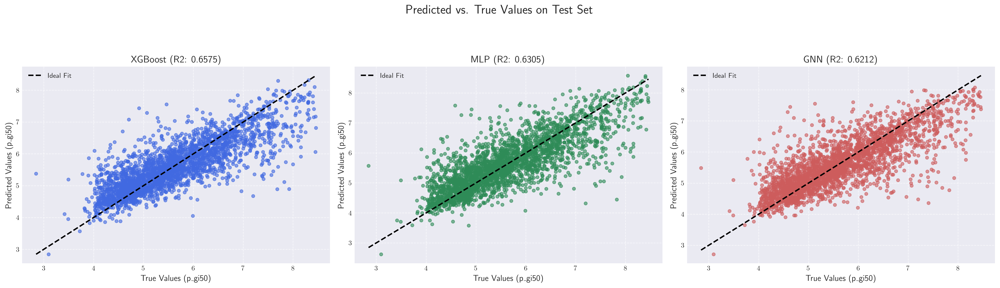


--- Model Performance Visualizations Complete ---


In [51]:
print("\n--- Generating Model Performance Visualizations ---")

# Set up the plotting style
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.dpi'] = 300 # High resolution for better clarity
plt.rcParams['savefig.dpi'] = 300 # High resolution for saving

fig, axes = plt.subplots(1, 3, figsize=(20, 6)) # 1 row, 3 columns for 3 models
fig.suptitle('Predicted vs. True Values on Test Set', fontsize=18)

# XGBoost Plot
if xgboost_predictions is not None:
    ax = axes[0]
    ax.scatter(y_test, xgboost_predictions, alpha=0.6, s=20, color='royalblue')
    ax.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Ideal Fit')
    ax.set_title(f'XGBoost (R2: {model_metrics["XGBoost"]["R2"]:.4f})', fontsize=14)
    ax.set_xlabel('True Values (p_gi50)', fontsize=12)
    ax.set_ylabel('Predicted Values (p_gi50)', fontsize=12)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
else:
    axes[0].set_title('XGBoost (Not Available)')
    axes[0].axis('off')


# MLP Plot
if len(mlp_predictions) > 0 and len(mlp_true_targets) > 0:
    ax = axes[1]
    ax.scatter(mlp_true_targets, mlp_predictions, alpha=0.6, s=20, color='seagreen')
    ax.plot([mlp_true_targets.min(), mlp_true_targets.max()], [mlp_true_targets.min(), mlp_true_targets.max()], 'k--', lw=2, label='Ideal Fit')
    ax.set_title(f'MLP (R2: {model_metrics["MLP"]["R2"]:.4f})', fontsize=14)
    ax.set_xlabel('True Values (p_gi50)', fontsize=12)
    ax.set_ylabel('Predicted Values (p_gi50)', fontsize=12) # Share y-label with first plot
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
else:
    axes[1].set_title('MLP (Not Available)')
    axes[1].axis('off')


# GNN Plot
if len(gnn_predictions) > 0 and len(gnn_true_targets) > 0:
    ax = axes[2]
    ax.scatter(gnn_true_targets, gnn_predictions, alpha=0.6, s=20, color='indianred')
    ax.plot([gnn_true_targets.min(), gnn_true_targets.max()], [gnn_true_targets.min(), gnn_true_targets.max()], 'k--', lw=2, label='Ideal Fit')
    ax.set_title(f'GNN (R2: {model_metrics["GNN"]["R2"]:.4f})', fontsize=14)
    ax.set_xlabel('True Values (p_gi50)', fontsize=12)
    ax.set_ylabel('Predicted Values (p_gi50)', fontsize=12) # Share y-label with first plot
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
else:
    axes[2].set_title('GNN (Not Available)')
    axes[2].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.9]) # Adjust layout to prevent title overlap
plt.show()

print("\n--- Model Performance Visualizations Complete ---")

#### 8.2.2. Plot Residuals vs Predictions
This sub-section generates residual plots for each model, displaying the difference between true and predicted `pGI50` values (i.e., residue) against the predicted values. These plots are crucial for identifying patterns in the errors, such as bias or heteroscedasticity, providing deeper insights into model behavior.


--- Analyzing Model Residuals ---


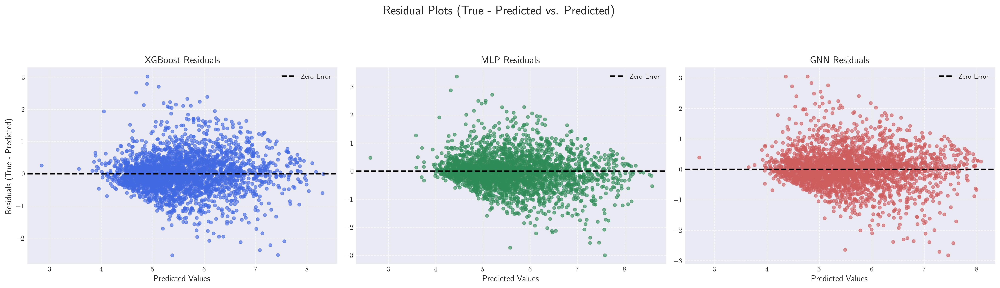


--- Residual Analysis Visualizations Complete ---


In [52]:
print("\n--- Analyzing Model Residuals ---")

# Set up the plotting style
plt.style.use('seaborn-v0_8-darkgrid')
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300

fig, axes = plt.subplots(1, 3, figsize=(20, 6))
fig.suptitle('Residual Plots (True - Predicted vs. Predicted)', fontsize=18)

# XGBoost Residual Plot
if xgboost_predictions is not None:
    ax = axes[0]
    # Ensure both y_test and xgboost_predictions are NumPy arrays for direct subtraction
    residuals_xgb = y_test.values.flatten() - xgboost_predictions.flatten()

    ax.scatter(xgboost_predictions.flatten(), residuals_xgb, alpha=0.6, s=20, color='royalblue')
    ax.axhline(y=0, color='k', linestyle='--', lw=2, label='Zero Error')
    ax.set_title('XGBoost Residuals', fontsize=14)
    ax.set_xlabel('Predicted Values', fontsize=12)
    ax.set_ylabel('Residuals (True - Predicted)', fontsize=12)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
else:
    axes[0].set_title('XGBoost Residuals (Not Available)')
    axes[0].axis('off')


# MLP Residual Plot
if len(mlp_predictions) > 0 and len(mlp_true_targets) > 0:
    ax = axes[1]
    residuals_mlp = np.array(mlp_true_targets).flatten() - np.array(mlp_predictions).flatten()
    ax.scatter(np.array(mlp_predictions).flatten(), residuals_mlp, alpha=0.6, s=20, color='seagreen')
    ax.axhline(y=0, color='k', linestyle='--', lw=2, label='Zero Error')
    ax.set_title('MLP Residuals', fontsize=14)
    ax.set_xlabel('Predicted Values', fontsize=12)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
else:
    axes[1].set_title('MLP Residuals (Not Available)')
    axes[1].axis('off')


# GNN Residual Plot
if len(gnn_predictions) > 0 and len(gnn_true_targets) > 0:
    ax = axes[2]
    residuals_gnn = np.array(gnn_true_targets).flatten() - np.array(gnn_predictions).flatten()
    ax.scatter(np.array(gnn_predictions).flatten(), residuals_gnn, alpha=0.6, s=20, color='indianred')
    ax.axhline(y=0, color='k', linestyle='--', lw=2, label='Zero Error')
    ax.set_title('GNN Residuals', fontsize=14)
    ax.set_xlabel('Predicted Values', fontsize=12)
    ax.legend()
    ax.grid(True, linestyle='--', alpha=0.7)
else:
    axes[2].set_title('GNN Residuals (Not Available)')
    axes[2].axis('off')

plt.tight_layout(rect=[0, 0.03, 1, 0.9])
plt.show()

print("\n--- Residual Analysis Visualizations Complete ---")

### 8.3. Visualize Molecular Predictions with Structures
This section delves deeper into the models' predictive behavior by visualizing actual molecular structures from the test set. Examples that illustrate the comparative strengths and weaknesses of the GNN against the tabular models (XGBoost, MLP) are highlighted, providing a direct visual correlation to the quantitative performance metrics observed in previous sections.
Molecules where:
* The GNN outperformed tabular models
* All models struggled
* A tabular model yielded more accurate predictions than the GNN
* The GNN predicted `pGI50` values with minimum error  

are examined. This allows for a clear, molecule-by-molecule illustration of the models' performance nuances across different scenarios within the test set.

#### 8.3.1. Consolidate Test Predictions for Visualization
Before proceeding with the detailed molecular visualizations, all relevant test set information is consolidated into a single pandas DataFrame. This includes the SMILES strings for each molecule, their true `pGI50` values, and the predictions generated by the XGBoost, MLP, and GNN models. Additionally, the absolute prediction error is calculated for each model on every molecule, which will be crucial for identifying specific cases for visualization.

In [53]:
test_results_df = pd.DataFrame(
    {
        "molregno": X_test["molregno"].values,
        "SMILES": X_test["canonical_smiles"].values,
        "True_pGI50": y_test["pGI50"].values,
        "XGB_Prediction": xgboost_predictions.flatten(),
        "MLP_Prediction": mlp_predictions.flatten(),
        "GNN_Prediction": gnn_predictions.flatten(),
    }
)

# Calculate the absolute error for the predictions
test_results_df['XGB_Abs_Error'] = np.abs(test_results_df['True_pGI50'] - test_results_df['XGB_Prediction'])
test_results_df['MLP_Abs_Error'] = np.abs(test_results_df['True_pGI50'] - test_results_df['MLP_Prediction'])
test_results_df['GNN_Abs_Error'] = np.abs(test_results_df['True_pGI50'] - test_results_df['GNN_Prediction'])

# Retrieve compound names from the SQLite database
compound_names_map = {}  # Dictionary to store molregno -> compound_name mappings
conn = None

try:
    conn = sqlite3.connect(chembl_db_file_path)
    cursor = conn.cursor()

    # Get unique molregnos to query the database efficiently
    molregnos_to_query = test_results_df["molregno"].dropna().unique().tolist()

    if molregnos_to_query:  # Only query if there are molregnos to look up
        # Convert molregnos to strings for the SQL IN clause
        molregno_str = ",".join(map(str, molregnos_to_query))

        # Query the compound_records table for molregno and compound name
        query = f"""
            SELECT molregno, compound_name
            FROM compound_records
            WHERE molregno IN ({molregno_str})
        """
        cursor.execute(query)

        # Fetch all results and populate the map
        for row in cursor.fetchall():
            compound_names_map[row[0]] = row[
                1
            ]  # row[0] is molregno, row[1] is compound_name

    print("Successfully retrieved compound names from ChEMBL.")

except FileNotFoundError:
    print(
        f"Error: ChEMBL database not found at {chembl_db_file_path}. Please verify the path."
    )
except sqlite3.Error as e:
    print(f"Database error while connecting or querying: {e}")
except Exception as e:
    print(f"An unexpected error occurred: {e}")
finally:
    if conn:
        conn.close()

# Add the 'Compound_Name' column to test_results_df by mapping molregno
test_results_df["Compound_Name"] = test_results_df["molregno"].map(compound_names_map)

# Fill NaN values (for molregnos not found in the database)
test_results_df["Compound_Name"] = test_results_df["Compound_Name"].fillna(
    "Name Not Found (ChEMBL SQLite DB)"
)

display(test_results_df.head(3))

Successfully retrieved compound names from ChEMBL.


,molregno,SMILES,True_pGI50,XGB_Prediction,MLP_Prediction,GNN_Prediction,XGB_Abs_Error,MLP_Abs_Error,GNN_Abs_Error,Compound_Name
0,1568757,CC(=O)N1CCN(C(=O)[C@@H]2CC[C@@H](C)N2C(=O)C2=C...,5.840968,6.060444,6.123609,5.918548,0.219477,0.282641,0.077580,"(5R,6S)-2-{[(2S,5R)-2-{[(3S)-4-Acetyl-3-methyl..."
1,2344922,COc1ccc2c(c1)[C@]1(C[C@H]1c1ccc3c(-c4ccc(C5(F)...,6.443064,6.642598,6.133529,7.019395,0.199534,0.309535,0.576331,"(1R,2S)-2-(3-(4-(4-fluoro-1-methylpiperidin-4-..."
2,341438,NS(=O)(=O)c1ccc(Nc2cc(OCC3CCCCC3)nc3ncnn23)cc1,4.958607,5.194958,5.071099,4.899598,0.236351,0.112492,0.059009,"4-(5-(cyclohexylmethoxy)-[1,2,4]triazolo[1,5-a..."


#### 8.3.2. Define Helper Functions
This section defines helper functions to deal with LaTeX special characters and to display molecular structures with their names, true `pGI50` values, and predictions.

##### 8.3.2.1. Define Helper Function to Deal With LaTeX Special Characters
A helper function is defined here to escape common LaTeX special characters in a string, particularly the compound names in this project.

In [54]:
def escape_latex_special_chars(text):
    if not isinstance(text, str):
        return str(text)  # Ensure it's a string for processing

    # Define a dictionary of replacements
    latex_replacements = {
        "\\": r"\textbackslash{}",  # Escape backslash itself first
        "{": r"\{",
        "}": r"\}",
        "&": r"\&",
        "%": r"\%",
        "$": r"\$",
        "#": r"\#",
        "_": r"\_",
        "^": r"\textasciicircum{}",
        "~": r"\textasciitilde{}",
        # Add more if needed
    }

    # Use re.sub with a lambda function for replacements
    def replace_char(match):
        return latex_replacements.get(match.group(0), match.group(0))

    # Create a regex pattern that matches any of the special characters
    pattern = re.compile("|".join(re.escape(key) for key in latex_replacements.keys()))

    return pattern.sub(replace_char, text)

##### 8.3.2.2. Define Helper Function for Molecule Visualization
A helper function is defined here to streamline the process of displaying molecular structures with their associated true `pGI50` values, predictions, and errors. This function utilizes RDKit's drawing capabilities to render 2D molecular structures and annotates them with key performance metrics for easy comparative analysis.

In [55]:
def display_molecules_with_predictions(df_subset, title, mols_per_row=2):
    print(f"\n### {title}")

    # Calculate grid dimensions
    num_mols = len(df_subset)
    if num_mols == 0:
        print(f"No molecules in {title} to display.")
        return
    num_rows = math.ceil(num_mols / mols_per_row)

    # Create the Matplotlib figure and subplots
    # Adjust the width and height values here to control the size of each molecule's plot area.
    fig_width_per_mol = 6
    fig_height_per_mol = 7

    fig, axes = plt.subplots(
        num_rows,
        mols_per_row,
        figsize=(mols_per_row * fig_width_per_mol, num_rows * fig_height_per_mol),
    )

    # Flatten the axes array for easier iteration
    if num_rows > 1 or mols_per_row > 1:
        axes = axes.flatten()
    else:  # Handle case of single subplot (num_rows=1, mols_per_row=1)
        axes = [axes]  # Make it a list so the loop works consistently

    # RDKit drawing options for the molecules themselves
    draw_options = rdMolDraw2D.MolDrawOptions()
    draw_options.bondLineWidth = 5
    draw_options.fixedFontSize = 40

    # Define molecule image size within each subplot (high for SVG source)
    svg_source_width = 1600
    svg_source_height = 1200

    # Iterate through the DataFrame to draw each molecule and its data

    for i, (idx, row) in enumerate(df_subset.iterrows()):
        if i >= len(axes):  # Safety break if more molecules than subplots allocated
            break

        ax = axes[i]  # Get the current subplot axis
        smiles = row["SMILES"]
        mol = Chem.MolFromSmiles(smiles)

        compound_name = row["Compound_Name"]

        # Draw molecule
        if mol:
            # Generate 2D coordinates if they don't exist (good practice)
            if mol.GetNumConformers() == 0:
                rdDepictor.Compute2DCoords(mol)

            # Use cairosvg for high-resolution rendering
            # Draw molecule to SVG string
            drawer = rdMolDraw2D.MolDraw2DSVG(svg_source_width, svg_source_height)
            drawer.SetDrawOptions(draw_options) # Apply the drawing options
            drawer.DrawMolecule(mol)
            drawer.FinishDrawing()

            # Get the SVG string
            svg_data = drawer.GetDrawingText()

            # Convert the SVG string into high-resolution PNG bytes
            png_bytes = cairosvg.svg2png(bytestring=svg_data.encode('utf-8'))

            # Open PNG bytes as PIL image
            pil_img = Image.open(BytesIO(png_bytes))
            ax.imshow(pil_img)
        else:
            # If SMILES is invalid, display a placeholder text
            ax.text(0.5, 0.5, "Invalid SMILES", ha='center', va='center', fontsize=20, color='red')
            ax.set_xticks([])
            ax.set_yticks([])

        # Add Detailed Caption/Predictions
        # Hide the default Matplotlib axes ticks and spines
        ax.axis('off')

        # Escape LaTeX special chars, THEN wrap
        # Adjust 'width' based on the desired width of each line
        escaped_compound_name = escape_latex_special_chars(str(compound_name))
        wrapped_compound_name = textwrap.fill(escaped_compound_name, width=45)

        # Add the rest of the prediction details below the molecule
        # Negative y-values place text below the main plot area
        text_y_start = -0.05 # Starting y position for text block relative to bottom of plot
        text_fontsize = 12

        ax.text(0.5, text_y_start,
                (r"$\textbf{Compound Name:}$ " + wrapped_compound_name + "\n"
                 r"$\textbf{True pGI50 value:}$ " + f"{row['True_pGI50']:.2f}\n"
                 r"$\textbf{GNN Prediction:}$ " + f"{row['GNN_Prediction']:.2f} (Err:{row['GNN_Abs_Error']:.2f})\n"
                 r"$\textbf{MLP Prediction:}$ " + f"{row['MLP_Prediction']:.2f} (Err:{row['MLP_Abs_Error']:.2f})\n"
                 r"$\textbf{XGB Prediction:}$ " + f"{row['XGB_Prediction']:.2f} (Err:{row['XGB_Abs_Error']:.2f})"),
                transform=ax.transAxes, # Ensures coordinates are relative to the axes
                fontsize=text_fontsize,
                verticalalignment='top', # Align top of text block with y-start
                wrap=True, # Enable text wrapping within the allocated text width
                horizontalalignment='center'
               )

    # Clean up unused subplots
    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j]) # Delete any unused axes

    plt.tight_layout()
    plt.show() # Display the figure

#### 8.3.3. Visualize Molecules with Superior Performance by GNN
This section displays molecules from the test set where the GNN demonstrated a **significant advantage** in predictive accuracy over both the MLP and XGBoost models. These examples clearly illustrate specific instances where the GNN achieved notably lower absolute errors compared to the tabular approaches.

Total molecules where GNN overperformed by 0.5 error margin: 32

### Molecules Where GNN Significantly Outperformed Tabular Models (Top by advantage)


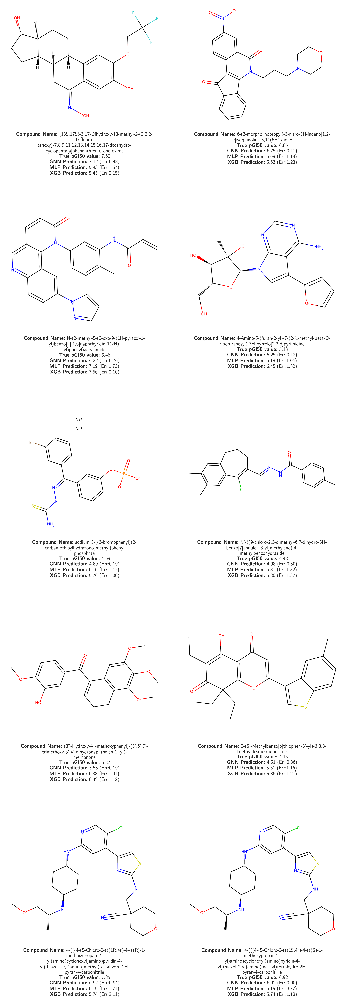

In [56]:
# Adjust error margin as needed
error_margin_gnn_outperforms = 0.5

# Calculate the advantage GNN has over MLP and XGBoost for each molecule
test_results_df["GNN_vs_MLP_Advantage"] = (
    test_results_df["MLP_Abs_Error"] - test_results_df["GNN_Abs_Error"]
)
test_results_df["GNN_vs_XGB_Advantage"] = (
    test_results_df["XGB_Abs_Error"] - test_results_df["GNN_Abs_Error"]
)

# Define the mask based on the error margin
gnn_outperforms_mask = (
    test_results_df["GNN_vs_MLP_Advantage"] > error_margin_gnn_outperforms
) & (test_results_df["GNN_vs_XGB_Advantage"] > error_margin_gnn_outperforms)

filtered_outperforms_df = test_results_df[gnn_outperforms_mask]
print(
    f"Total molecules where GNN overperformed by {error_margin_gnn_outperforms} error margin: {len(filtered_outperforms_df)}"
)

# Calculate the minimum advantage of the GNN
filtered_outperforms_df["Min_GNN_Advantage"] = filtered_outperforms_df[
    ["GNN_vs_MLP_Advantage", "GNN_vs_XGB_Advantage"]
].min(axis=1)

# Sort by the GNN minimum advantage in descending order
gnn_outperforms_df = (
    filtered_outperforms_df[gnn_outperforms_mask]
    .sort_values("Min_GNN_Advantage", ascending=False)
    .head(10)
)
display_molecules_with_predictions(
    gnn_outperforms_df, "Molecules Where GNN Significantly Outperformed Tabular Models (Top by advantage)"
)

#### 8.3.4. Visualize Molecules Where Tabular Models Outperformed GNN
This section visualizes molecules from the test set where a tabular model (either MLP or XGBoost) yielded a **notably more accurate prediction** than the GNN. These cases serve as direct examples illustrating specific instances where the GNN's absolute error was significantly higher than that of a tabular model.

Total molecules where GNN underperformed by 1 error margin: 22

### Molecules Where a Tabular Model Outperformed GNN


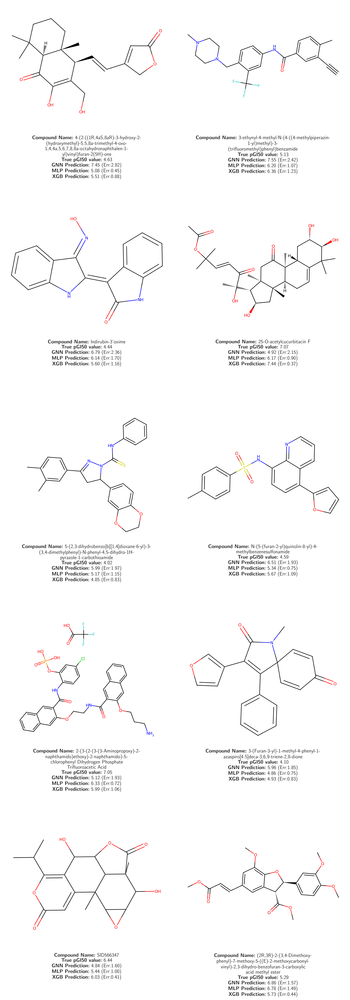

In [57]:
# Adjust error margin as needed
error_margin_gnn_underperforms = 1

# Calculate how much GNN's error is worse than MLP's and XGBoost's
test_results_df["GNN_vs_MLP_Underperformance"] = (
    test_results_df["GNN_Abs_Error"] - test_results_df["MLP_Abs_Error"]
)
test_results_df["GNN_vs_XGB_Underperformance"] = (
    test_results_df["GNN_Abs_Error"] - test_results_df["XGB_Abs_Error"]
)

gnn_underperforms_mlp_mask = (
    test_results_df["GNN_vs_MLP_Underperformance"] > error_margin_gnn_underperforms
)
gnn_underperforms_xgb_mask = (
    test_results_df["GNN_vs_XGB_Underperformance"] > error_margin_gnn_underperforms
)

filtered_underperforms_df = test_results_df[
    gnn_underperforms_mlp_mask | gnn_underperforms_xgb_mask
]
print(
    f"Total molecules where GNN underperformed by {error_margin_gnn_underperforms} error margin: {len(filtered_underperforms_df)}"
)

# Calculate the maximum underperformance to sort by the 'most underperformed' scenario
filtered_underperforms_df["Max_GNN_Underperformance"] = filtered_underperforms_df[
    ["GNN_vs_MLP_Underperformance", "GNN_vs_XGB_Underperformance"]
].max(axis=1)

# Sort by the maximum underperformance in descending order
gnn_underperforms_df = (
    filtered_underperforms_df[gnn_underperforms_mlp_mask | gnn_underperforms_xgb_mask]
    .sort_values("GNN_Abs_Error", ascending=False)
    .head(10)
)

display_molecules_with_predictions(
    gnn_underperforms_df, "Molecules Where a Tabular Model Outperformed GNN"
)

#### 8.3.5. Visualize Molecules Where All Models Struggled
This section focuses on molecules from the test set for which **all three models (XGBoost, MLP, and GNN) exhibited relatively high prediction errors**. These examples represent challenging prediction cases where none of the current modeling approaches were able to accurately estimate the pGI50 values


Total molecules shown where all models struggled with at least 1 error margin: 10

### Molecules Where All Models Struggled (High Errors)


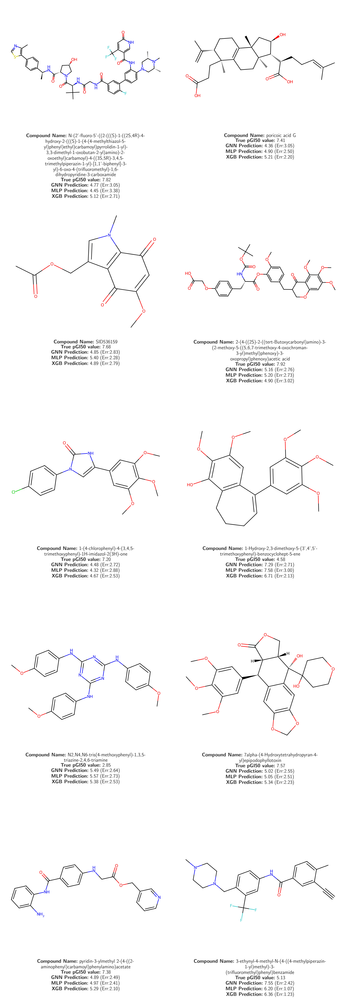

In [58]:
error_margin_all_models_struggle = 1
all_struggle_df = test_results_df[(test_results_df['GNN_Abs_Error'] > error_margin_all_models_struggle) & \
                                  (test_results_df['MLP_Abs_Error'] > error_margin_all_models_struggle) & \
                                  (test_results_df['XGB_Abs_Error'] > error_margin_all_models_struggle)].nlargest(10, 'GNN_Abs_Error')

print(
    f"Total molecules shown where all models struggled with at least {error_margin_all_models_struggle} error margin: {len(all_struggle_df)}"
)

display_molecules_with_predictions(
    all_struggle_df, "Molecules Where All Models Struggled (High Errors)"
)

#### 8.3.6. Visualize Molecules Best Predicted by GNN
Finally, this section highlights the molecules for which the GNN model achieved its **most precise predictions** on the test set (i.e., the lowest absolute errors). These examples showcase the GNN's strong predictive capabilities when it performs at its best, demonstrating its ability to accurately estimate `pGI50` for these specific compounds.


### GNN's 10 Most Accurate Predictions (Lowest Errors)


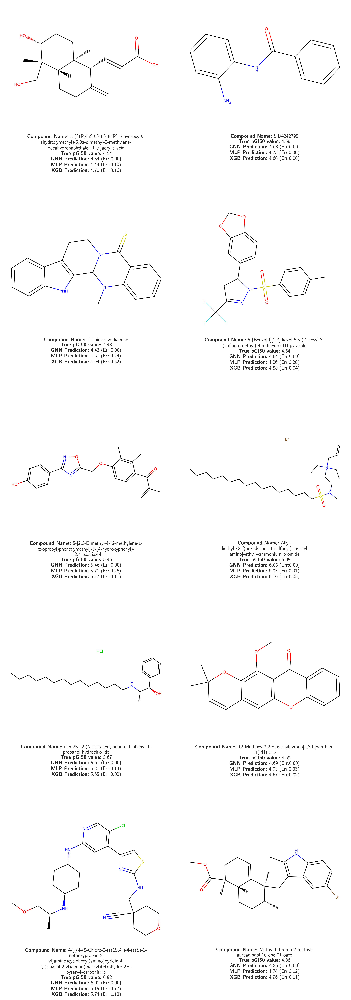

In [59]:
gnn_best_predictions_df = test_results_df.nsmallest(10, "GNN_Abs_Error")
display_molecules_with_predictions(
    gnn_best_predictions_df, f"GNN's {len(gnn_best_predictions_df)} Most Accurate Predictions (Lowest Errors)"
)

---

## 9. Project Conclusion
This final section summarizes the key findings from the model comparison, highlighting how each model performed against the project's objective of predicting `pGI50`. It provides a verdict on the effectiveness of **leveraging specialized models** that are designed to capture the inherent nature of the data, as opposed to more generalized approaches.

### 9.1. Comparative Performance Summary
A concise summary of the quantitative performance metrics (RMSE and R2) for each model is presented, drawing direct comparisons and identifying the best-performing model based on the evaluation on the unseen test data.

The following table summarizes the test set performance for each model:

| Model                         | RMSE       | R2          |
| :---------------------------- | :--------- | :---------- |
| **True Statistical Baseline** | **0.9878** | **-0.0002** |
| **XGBoost**                   | **0.5781** | **0.6575**  |
| MLP                           | 0.6004     | 0.6305      |
| GNN                           | 0.6079     | 0.6212      |

This analysis establishes the **True Statistical Baseline (RMSE: 0.9878)** as the performance floor, validating the machine learning approach. The **XGBoost model emerged as the top performer**, achieving the lowest **RMSE (0.5781)** (and highest **R2 score (0.6575)**), representing a ***41.48% reduction in error*** compared to the baseline.

### 9.2. Model Effectiveness: Tabular Features vs. Graph Processing
The key finding of this project is that the predictive power of the explicitly engineered tabular features significantly surpassed the signal extracted from the raw molecular graph topology.
- **XGBoost Success**: The tree-based XGBoost model excels at exploiting high-quality, pre-computed features (like physicochemical descriptors). Its strong performance confirms that the chosen feature set contains the most discriminative information for predicting `pGI50`.

- **GNN Limitation**: The GNN, despite being designed to understand atom-bond connectivity, could not extract additional predictive value. Its RMSE of 0.6079 is 0.0298 higher (5.15% increase in error) than the XGBoost result, and only marginally worse than the MLP.

This result challenges the notion that GNNs are always superior for molecular property prediction; rather, it suggests that when high-quality RDKit features are available, a robust model like XGBoost can effectively maximize their utilization. The performance ceiling for the current GNN architecture appears to have been reached early in the hyperparameter search.

### 9.3. Overall Project Learnings and Future Work
This project successfully demonstrated a robust end-to-end machine learning pipeline for molecular property prediction, emphasizing systematic data preparation, hyperparameter optimization, and rigorous model evaluation. The comparative analysis provided clear insights into the strengths strengths of generalized modeling over complex topology for this specific dataset.

Future work could involve:
* **Incorporating 3D Molecular Information**: The GNN's failure to gain an edge may be due to its reliance solely on 2D graph structure. Integrating 3D structural data (e.g., bond angles and distances) into the GNN input could be necessary to unlock the model's true potential.

* **Exploring Advanced GNN Architectures**: Investigating more sophisticated GNN layers (e.g., attention mechanisms, message passing variants) or deeper models to potentially capture more intricate molecular patterns that existing layers missed.

* **Ensemble Modeling**: Creating an ensemble that combines the high accuracy of the XGBoost model with the structural insights of the GNN could yield an overall more robust and accurate final prediction.
---